# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

### Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

The goal is to identify factors that affect the price of used cars to help a used car dealership optimize inventory.

In [ ]:
**Inventory of resources:**
* Dataset of 42k used cars from Kaggle

**Assumptions:**
* That the provided dataset contains successful car sales 
**Constraints:**
* There is a limit to the one dataset we can use, since we cannot use any other resources our analysis is limitied to whatever we can gather from this one dataset.

**Data Mining Goals:**
* Predict the price of a used car, based on past used car sales. 

In [371]:
import pandas as pd
import numpy as np
from scipy import stats

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
plt.style.use("fivethirtyeight")
sns.set(style="whitegrid", context="notebook", font_scale=1.1)
pd.set_option('display.float_format', lambda x: '%.2f' % x)

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import OneHotEncoder, StandardScaler, PolynomialFeatures, MinMaxScaler, OrdinalEncoder
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.compose import ColumnTransformer, make_column_transformer, make_column_selector
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.feature_selection import VarianceThreshold
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

from scipy.sparse import csr_matrix
from category_encoders import TargetEncoder

import warnings
warnings.filterwarnings("ignore")
print("All modules loaded")

All modules loaded


### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

In [372]:
df = pd.read_csv('./data/vehicles.csv')
df.sample(5)

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
140608,7316310176,chicago,5499,2004.00,lincoln,town car,NaN,NaN,gas,118113.00,clean,automatic,1LNHM81W34Y627822,NaN,full-size,sedan,white,il
47821,7305849891,redding,7500,2009.00,mercedes-benz,c-class,excellent,6 cylinders,gas,164415.00,clean,automatic,WDDGF54X39F204762,rwd,compact,sedan,blue,ca
122235,7316125370,atlanta,2500,2013.00,hyundai,sonata,NaN,NaN,gas,131000.00,clean,automatic,NaN,NaN,NaN,NaN,NaN,ga
218642,7307304927,jackson,31500,2019.00,ford,f150,NaN,6 cylinders,gas,106054.00,clean,automatic,NaN,4wd,NaN,NaN,white,ms
266778,7314369806,buffalo,59700,2016.00,chevrolet,NaN,NaN,8 cylinders,other,2522.00,clean,automatic,1G1YU2D69G5700414,fwd,compact,other,NaN,ny


In [373]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_color   296677 non-null  object 
 17  state         426880 non-null  object 
dtypes: f

In [374]:
orig_df = df.copy()
shape_before_cleaning = df.shape
shape_before_cleaning

(426880, 18)

In [375]:
df.describe().round(2)

,id,price,year,odometer
count,426880.00,426880.00,425675.00,422480.00
mean,7311486634.22,75199.03,2011.24,98043.33
std,4473170.41,12182282.17,9.45,213881.50
min,7207408119.00,0.00,1900.00,0.00
25%,7308143339.25,5900.00,2008.00,37704.00
50%,7312620821.00,13950.00,2013.00,85548.00
75%,7315253543.50,26485.75,2017.00,133542.50
max,7317101084.00,3736928711.00,2022.00,10000000.00


In [376]:
df.describe(include='object')

,region,manufacturer,model,condition,cylinders,fuel,title_status,transmission,VIN,drive,size,type,paint_color,state
count,426880,409234,421603,252776,249202,423867,418638,424324,265838,296313,120519,334022,296677,426880
unique,404,42,29649,6,8,5,6,3,118246,3,4,13,12,51
top,columbus,ford,f-150,good,6 cylinders,gas,clean,automatic,1FMJU1JT1HEA52352,4wd,full-size,sedan,white,ca
freq,3608,70985,8009,121456,94169,356209,405117,336524,261,131904,63465,87056,79285,50614


**Univariate analysis**

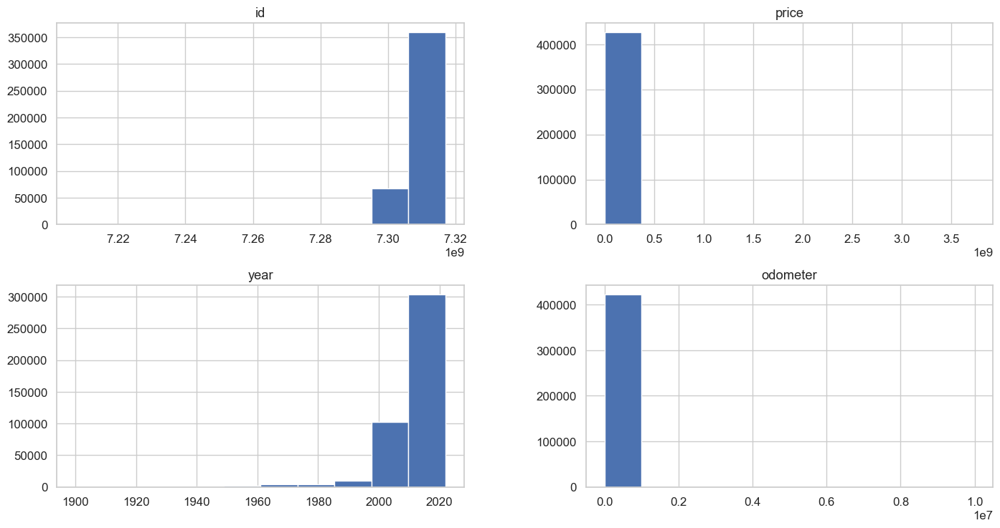

In [377]:
# get to know the numerical columns 
df.hist(figsize = (15,8));

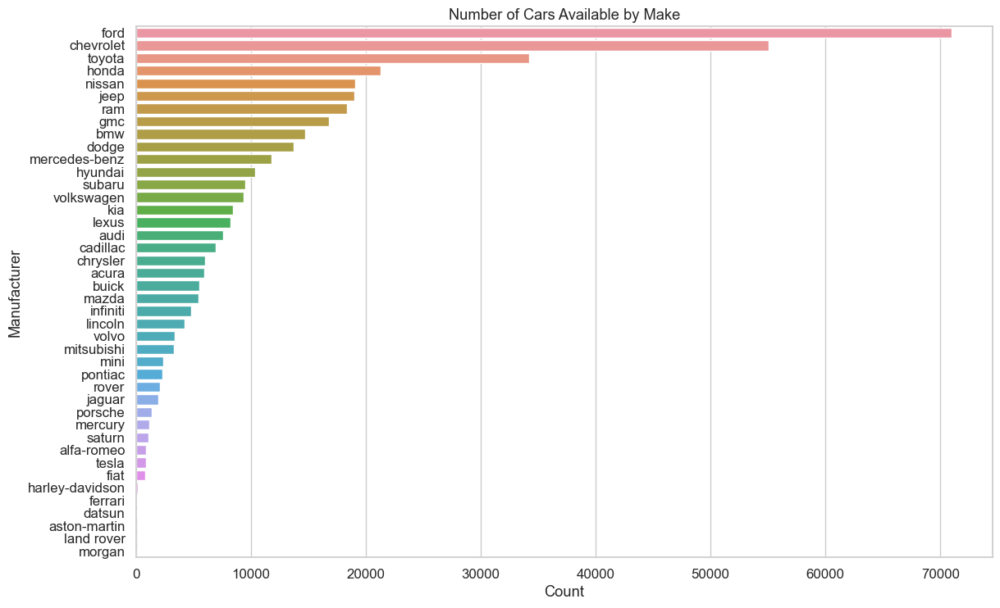

In [378]:
plt.figure(figsize=(12, 8))
sns.countplot(y='manufacturer', data=df, order=df['manufacturer'].value_counts().index)
plt.title('Number of Cars Available by Make')
plt.xlabel('Count')
plt.ylabel('Manufacturer')
plt.show()

**Bivariate Analysis**

In [379]:
corr = df.corr(numeric_only=True)
corr

,id,price,year,odometer
id,1.00,-0.00,-0.06,0.01
price,-0.00,1.00,-0.00,0.01
year,-0.06,-0.00,1.00,-0.16
odometer,0.01,0.01,-0.16,1.00


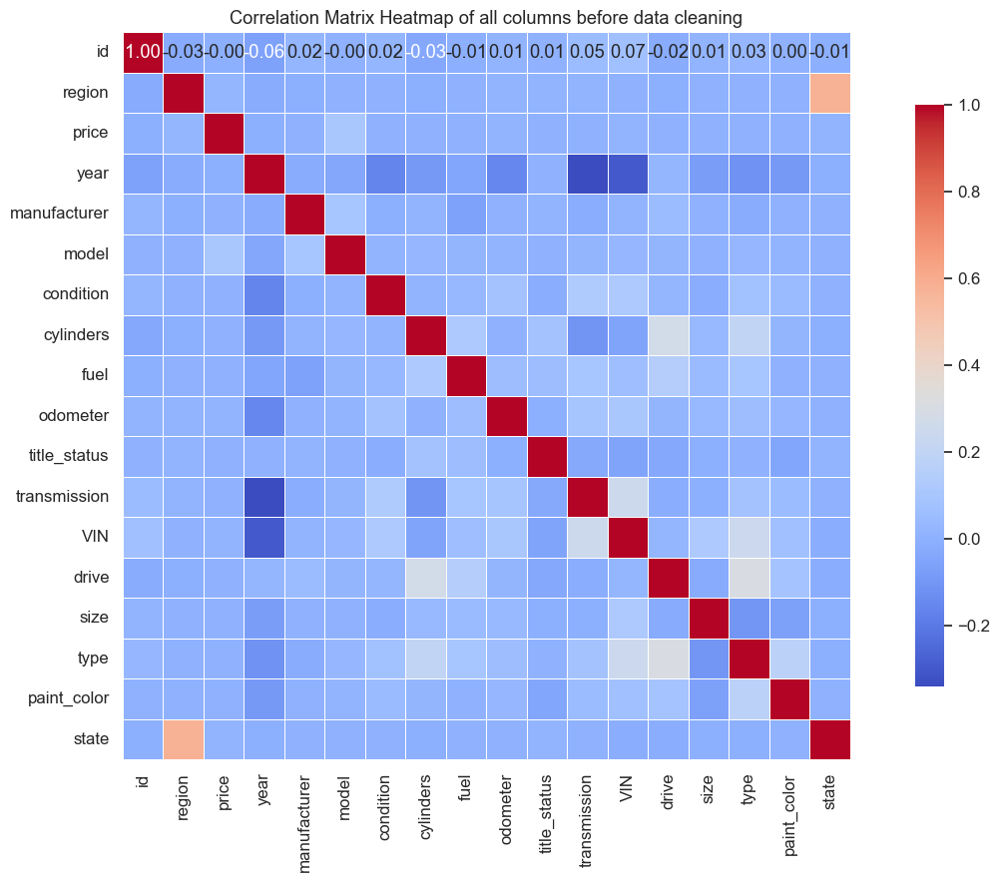

In [380]:
encoded_df = df.copy()
encoder = TargetEncoder()

categorical_columns = ['region', 'manufacturer', 'model', 'condition', 'cylinders', 'fuel', 'title_status', 'transmission', 'drive', 'size', 'VIN', 'type', 'paint_color', 'state']
encoded_df[categorical_columns] = encoder.fit_transform(encoded_df[categorical_columns], encoded_df['price'])
correlation_matrix = encoded_df.corr()

heatmap = sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=.5, square=True, cbar_kws={"shrink": .8}, mask=None)
plt.title('Correlation Matrix Heatmap of all columns before data cleaning')
plt.show()

### Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

In [381]:
missing_percent = df.isna().mean().round(4)*100 # percentage of missing values 
missing_percent

id              0.00
region          0.00
price           0.00
year            0.28
manufacturer    4.13
model           1.24
condition      40.79
cylinders      41.62
fuel            0.71
odometer        1.03
title_status    1.93
transmission    0.60
VIN            37.73
drive          30.59
size           71.77
type           21.75
paint_color    30.50
state           0.00
dtype: float64

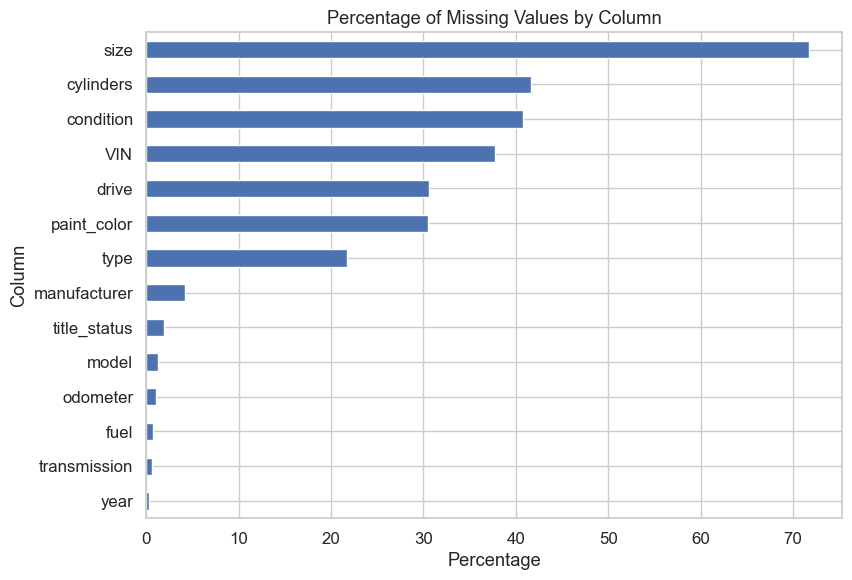

In [382]:
missing_percent = missing_percent[missing_percent > 0]
plt.figure(figsize=(8, 6))
missing_percent.sort_values().plot(kind='barh')
plt.title('Percentage of Missing Values by Column')
plt.xlabel('Percentage')
plt.ylabel('Column')
plt.show()

**Ensuring Data Quality**

In [383]:
# remove rows that have more than 10 missing entries, this is bad data
min_non_missing = df.shape[1] - 8
df = df.dropna(thresh=min_non_missing)

In [384]:
df.query("price <= 0")

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
46,7315039307,auburn,0,2011.00,jeep,compass,excellent,NaN,gas,99615.00,clean,automatic,NaN,NaN,full-size,SUV,NaN,al
126,7305672709,auburn,0,2018.00,chevrolet,express cargo van,like new,6 cylinders,gas,68472.00,clean,automatic,1GCWGAFP8J1309579,rwd,full-size,van,white,al
127,7305672266,auburn,0,2019.00,chevrolet,express cargo van,like new,6 cylinders,gas,69125.00,clean,automatic,1GCWGAFP4K1214373,rwd,full-size,van,white,al
128,7305672252,auburn,0,2018.00,chevrolet,express cargo van,like new,6 cylinders,gas,66555.00,clean,automatic,1GCWGAFPXJ1337903,rwd,full-size,van,white,al
191,7316755272,birmingham,0,2015.00,nissan,sentra,excellent,4 cylinders,gas,99505.00,clean,automatic,3N1AB7AP8FY348505,fwd,NaN,sedan,silver,al
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426764,7303347225,wyoming,0,2018.00,NaN,peterbilt 579,NaN,NaN,diesel,1.00,clean,automatic,NaN,NaN,NaN,NaN,NaN,wy
426812,7302877815,wyoming,0,2006.00,toyota,scion tc,excellent,4 cylinders,gas,195000.00,clean,automatic,JTKDE177460109655,fwd,NaN,NaN,silver,wy
426832,7302353283,wyoming,0,2004.00,toyota,prius,excellent,4 cylinders,hybrid,239000.00,clean,automatic,JTDKB20U840108051,fwd,NaN,NaN,blue,wy
426836,7302301268,wyoming,0,2018.00,ram,2500,excellent,6 cylinders,diesel,20492.00,clean,automatic,3C6UR5HL3JG307217,4wd,full-size,truck,white,wy


In [385]:
# remove entries that are "free" = $0
index_names = df[df['price'] == 0].index
df.drop(index_names, inplace=True)
df_sorted = df.sort_values(by='price', ascending=True)
df_sorted

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
389421,7313594702,charlottesville,1,2011.00,nissan,titan,NaN,NaN,gas,111111.00,clean,automatic,NaN,NaN,NaN,NaN,NaN,va
96979,7314330466,gainesville,1,2016.00,nissan,370z,excellent,6 cylinders,gas,19141.00,clean,other,JN1AZ4EH6GM937103,rwd,mid-size,coupe,black,fl
96978,7314330537,gainesville,1,2017.00,rover,discovery sport,excellent,4 cylinders,gas,31867.00,clean,other,SALCR2BG0HH636660,4wd,full-size,SUV,white,fl
96977,7314330663,gainesville,1,2015.00,lexus,rc 350,excellent,6 cylinders,gas,41987.00,clean,other,JTHHE5BC8F5005501,4wd,mid-size,coupe,black,fl
120245,7305641604,treasure coast,1,2015.00,ford,fusion,NaN,NaN,gas,100000.00,clean,automatic,NaN,NaN,NaN,NaN,NaN,fl
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37410,7314052904,modesto,3009548743,2021.00,chevrolet,NaN,NaN,8 cylinders,gas,1000.00,clean,automatic,NaN,4wd,NaN,NaN,NaN,ca
257840,7309735768,south jersey,3024942282,2000.00,mercedes-benz,benz s430,NaN,NaN,gas,100000.00,clean,automatic,NaN,NaN,NaN,NaN,NaN,nj
91576,7309730903,delaware,3024942282,2000.00,mercedes-benz,benz e320,NaN,NaN,gas,100000.00,clean,automatic,NaN,NaN,NaN,NaN,NaN,de
318592,7308056031,eugene,3736928711,2007.00,toyota,tundra,excellent,8 cylinders,gas,164000.00,clean,automatic,NaN,4wd,full-size,pickup,silver,or


In [386]:
# a lot of VIN's are listed multiple times, 261 see below 
df["VIN"].value_counts()

VIN
1FMJU1JT1HEA52352    261
3C6JR6DT3KG560649    235
1FTER1EH1LLA36301    231
5TFTX4CN3EX042751    227
1GCHTCE37G1186784    214
                    ... 
KMHDN45D82U440674      1
JTDKN3DU0C1490270      1
2C3CDXBG2FH752571      1
JTHBE1BL7FA008220      1
SAJGX2749VCOO8376      1
Name: count, Length: 105674, dtype: int64

In [387]:
# Drop duplicate VINS but keep rows where VIN is either '0', NaN

df['is_duplicate'] = df.duplicated('VIN', keep='first')
df['is_duplicate'] = df['is_duplicate'] & df['VIN'].notna()
df = df[~df['is_duplicate']]
df = df.drop(columns=['is_duplicate'])

In [388]:
df.sample(5)

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
94287,7315303152,ft myers / SW florida,13500,2011.00,bmw,335i,good,6 cylinders,gas,92000.00,clean,manual,NaN,NaN,mid-size,coupe,red,fl
366112,7311338839,austin,23924,2015.00,toyota,highlander,NaN,6 cylinders,gas,91515.00,clean,automatic,NaN,fwd,mid-size,SUV,brown,tx
415644,7308236671,appleton-oshkosh-FDL,5500,2008.00,buick,lacrosse cxl,excellent,6 cylinders,gas,187467.00,clean,automatic,NaN,fwd,NaN,sedan,NaN,wi
423620,7312463808,milwaukee,149,2021.00,kia,forte lxs,new,4 cylinders,gas,15.00,clean,automatic,NaN,fwd,full-size,sedan,orange,wi
358661,7316865761,nashville,27990,2019.00,subaru,outback 2.5i premium,good,NaN,gas,23167.00,clean,other,4S4BSAFC0K3244299,NaN,NaN,wagon,black,tn


In [389]:
df.duplicated().sum()

0

**Drop Unneccessary Columns**

In [390]:
df = df.drop(columns = ['id', 'title_status', 'model', 'state', 'region', 'VIN', 'size'], axis = 1)

**Impute missing values**

In [391]:
df['cylinders'].unique()

array(['8 cylinders', '6 cylinders', nan, '4 cylinders', '5 cylinders',
       'other', '3 cylinders', '10 cylinders', '12 cylinders'],
      dtype=object)

In [392]:
# convert cylinder to numerical and impute 
cylinder_mapping = {
    "6 cylinders": 6,
    "4 cylinders": 4,
    "8 cylinders": 8,
    "5 cylinders": 5,
    "10 cylinders": 10,
    "3 cylinders": 3,
    "12 cylinders": 12,
    "other": np.nan  # Convert 'other' to NaN
}

df['cylinders'] = df['cylinders'].replace(cylinder_mapping)
df["cylinders"] = pd.to_numeric(df["cylinders"])

Cylinder mean: 5.8
Cylinder median: 6.0


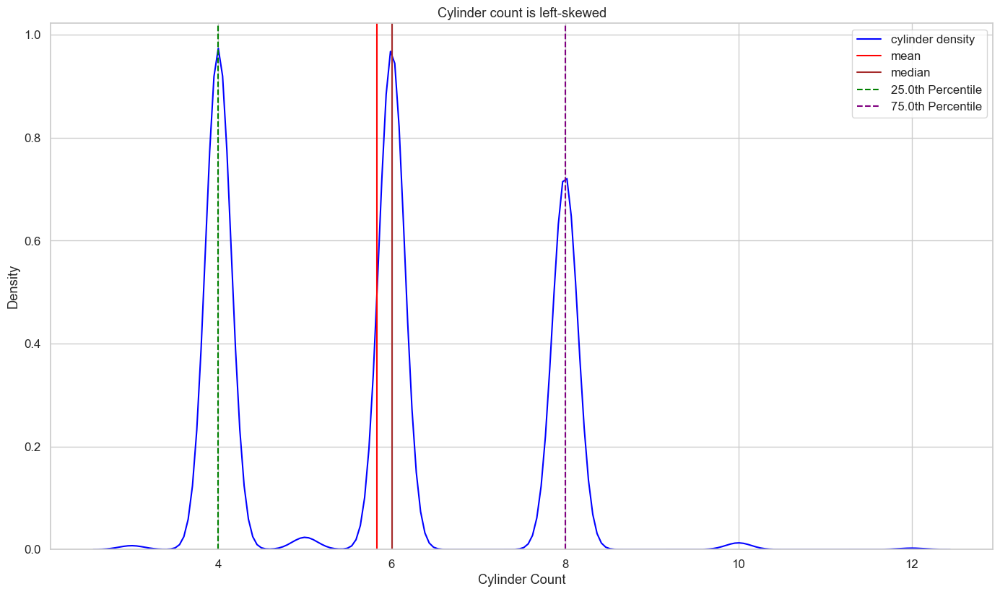

In [393]:
mean_cylinder = df['cylinders'].mean().round(1)
median_cylinder = df['cylinders'].median()
print(f"Cylinder mean: {mean_cylinder}")
print(f"Cylinder median: {median_cylinder}")

sns.kdeplot(df['cylinders'], label='cylinder density', color='blue')
plt.axvline(df['cylinders'].mean(), color = 'red', label = "mean")
plt.axvline(df['cylinders'].median(), color = 'brown', label = "median")
percentiles = [0.25, 0.75]
colors = ['green', 'purple']
for percentile, color in zip(percentiles, colors):
    plt.axvline(df['cylinders'].quantile(percentile), color=color, linestyle='--', label=f"{percentile*100}th Percentile")
plt.title("Cylinder count is left-skewed")
plt.xlabel('Cylinder Count')
plt.legend();

In [394]:
# impute cylinder with median and convert to integer 
df['cylinders'] = df['cylinders'].fillna(median_cylinder)
df['cylinders'] = df['cylinders'].astype(int)
print(df['cylinders'].value_counts(dropna=False))

cylinders
6     153082
4      58319
8      43605
5       1409
10       766
3        438
12       151
Name: count, dtype: int64


Odometer mean: 114830.5
Odometer median: 102000.0


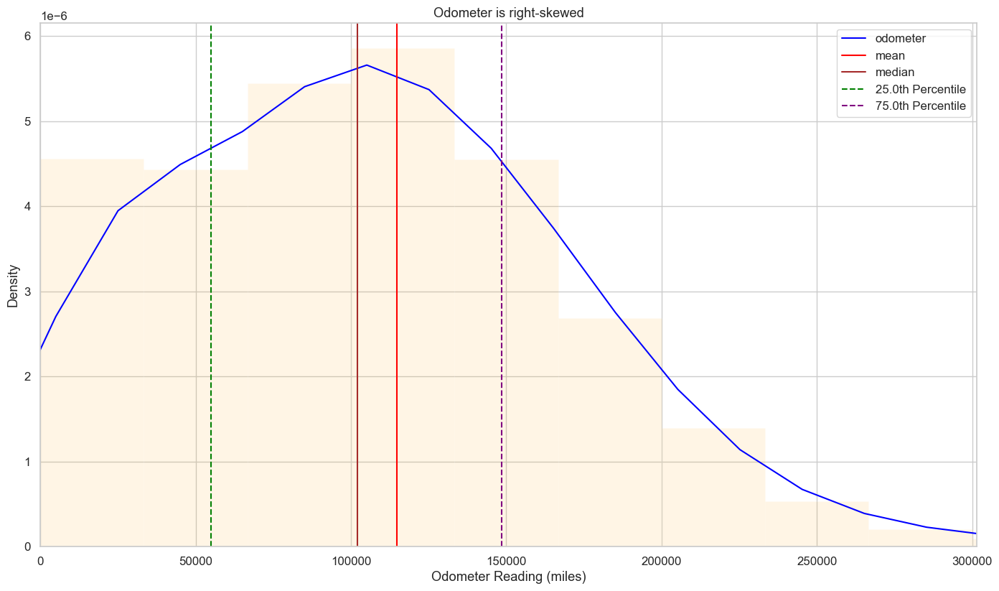

In [395]:
mean_odometer = df['odometer'].mean().round(1)
median_odometer = df['odometer'].median()
print(f"Odometer mean: {mean_odometer}")
print(f"Odometer median: {median_odometer}")

ax = df['odometer'].plot(kind='kde', xlim=(0, df['odometer'].quantile(0.99)), title="Odometer is right-skewed", color='blue')
df['odometer'].hist(density=True, bins=300, alpha=0.1, color='orange', ax=ax)
plt.axvline(mean_odometer, color='red', label = "mean")
plt.axvline(median_odometer, color='brown', label = "median")
percentiles = [0.25, 0.75]
colors = ['green', 'purple']
for percentile, color in zip(percentiles, colors):
    plt.axvline(df['odometer'].quantile(percentile), color=color, linestyle='--', label=f"{percentile*100}th Percentile")
plt.xlabel('Odometer Reading (miles)')
plt.legend();

In [396]:
# There is a ~12,100 difference between mean and median odometer 
# Since the odometer data is right-skewed we will impute the odometer value with the median value
df['odometer'] = df['odometer'].fillna(median_odometer)

Year mean 2009.2
Year median 2012.0


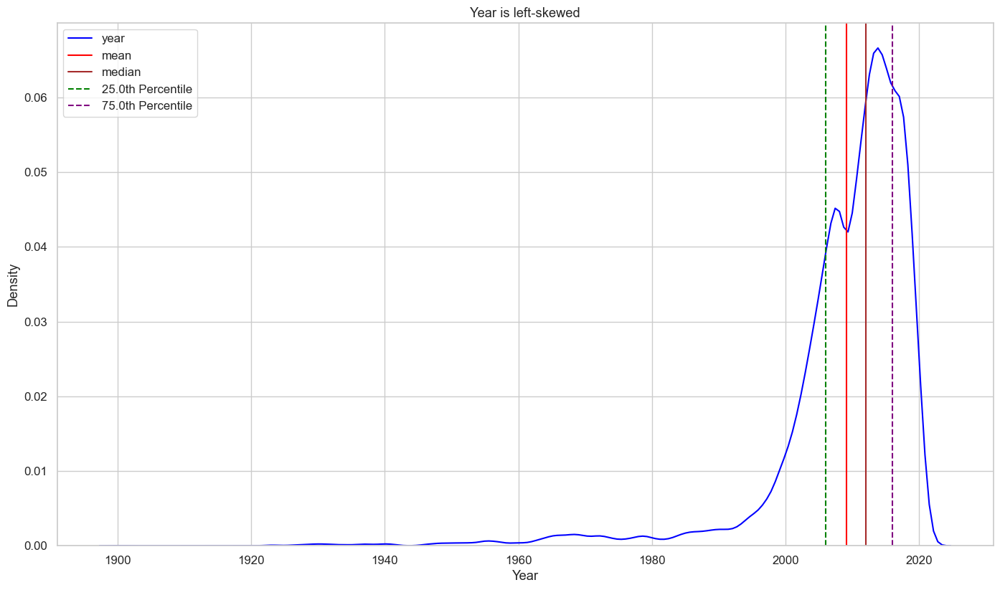

In [397]:
# impute last numerical value, year 
mean_year = df['year'].mean().round(1)
median_year = df['year'].median()
print(f"Year mean {mean_year}")
print(f"Year median {median_year}")

sns.kdeplot(df['year'], label='year', color='blue')
plt.axvline(df['year'].mean(), color = 'red', label = "mean")
plt.axvline(median_year, color = 'brown', label = "median")

percentiles = [0.25, 0.75]
colors = ['green', 'purple']
for percentile, color in zip(percentiles, colors):
    plt.axvline(df['year'].quantile(percentile), color=color, linestyle='--', label=f"{percentile*100}th Percentile")
plt.title("Year is left-skewed")
plt.xlabel('Year')
plt.legend();

In [398]:
df['year'] = df['year'].fillna(median_year)
df['year'] = df['year'].astype(int)

In [399]:
# impute categorical caolumns 

df['manufacturer'].fillna(df['manufacturer'].value_counts().idxmax(), inplace=True)
df['fuel'].fillna(df['fuel'].value_counts().idxmax(), inplace=True)
df['transmission'].fillna(df['transmission'].value_counts().idxmax(), inplace=True)
df['condition'].fillna(df['condition'].value_counts().idxmax(), inplace=True)
df['drive'].fillna(df['drive'].value_counts().idxmax(), inplace=True)
df['type'].fillna(df['type'].value_counts().idxmax(), inplace=True)
df['paint_color'].fillna(df['paint_color'].value_counts().idxmax(), inplace=True)

In [400]:
# data cleaning completed
df.isna().mean().round(4)*100

price          0.00
year           0.00
manufacturer   0.00
condition      0.00
cylinders      0.00
fuel           0.00
odometer       0.00
transmission   0.00
drive          0.00
type           0.00
paint_color    0.00
dtype: float64

In [401]:
shape_after_cleaning = df.shape
print(f" Remaining % of dataset after cleaning: {round((shape_after_cleaning[0] / shape_before_cleaning[0] * 100), 3)}%")

 Remaining % of dataset after cleaning: 60.385%


In [402]:
df.duplicated().sum()

36173

In [403]:
df.drop_duplicates(keep='first', inplace=True)
df.duplicated().sum()

0

**Outliers treatment**

In [404]:
pd.set_option('display.float_format', lambda x: '%.2f' % x)
df[['price']].describe()

,price
count,221597.00
mean,112490.34
std,15639424.86
min,1.00
25%,5900.00
50%,10995.00
75%,20393.00
max,3736928711.00


In [405]:
p = [0.05, .85,.95, .99]

In [406]:
df[['price']].describe(p)

,price
count,221597.00
mean,112490.34
std,15639424.86
min,1.00
5%,1599.00
50%,10995.00
85%,27950.00
95%,40995.00
99%,65500.00
max,3736928711.00


In [407]:
price_low = df["price"].quantile(0.10)
price_high = df["price"].quantile(0.9999)
df = df[(df["price"] < price_high) & (df["price"] > price_low)]

In [408]:
print(df.price.max())
df.price.min()

6995495


3045

In [409]:
print(df.odometer.max())
df.odometer.min()

10000000.0


0.0

In [410]:
odometer_low = df["odometer"].quantile(0.01)
odometer_high = df["odometer"].quantile(0.999)
df = df[(df["odometer"] < odometer_high)& (df["odometer"] > odometer_low)]
print(df.odometer.max())
df.odometer.min()

1200000.0


79.0

**EDA after data cleaning**

**Univariate Analysis of Target Column: `price`**

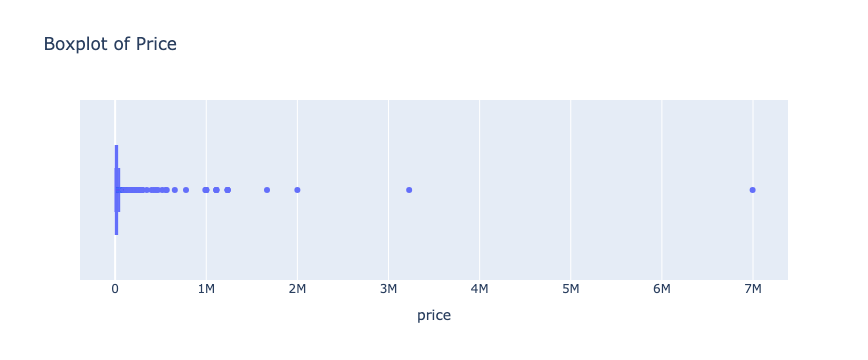

In [412]:
px.box(df, x="price", title = "Boxplot of Price")

**We will use the numpy function to calculate the log of price and add to the dataframe**

In [414]:
# since our data is skewed we will transform it using log
df["price_log"] = np.log(df['price'])

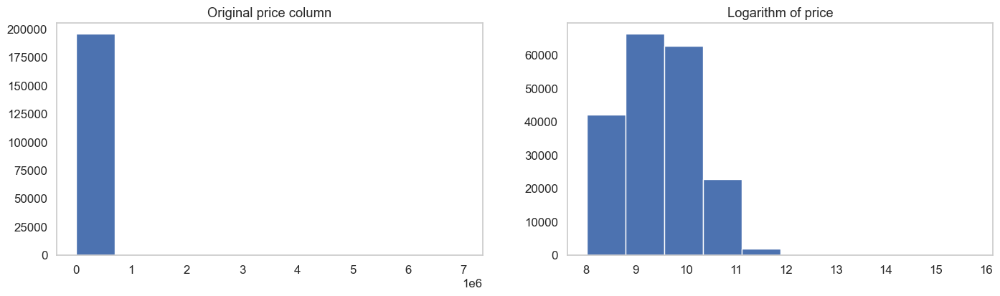

In [415]:
fig, ax = plt.subplots(1, 2, figsize = (15, 4))
ax[0].hist(df['price'])
ax[0].grid()
ax[0].set_title('Original price column')
ax[1].hist(np.log(df['price']))
ax[1].grid()
ax[1].set_title('Logarithm of price');

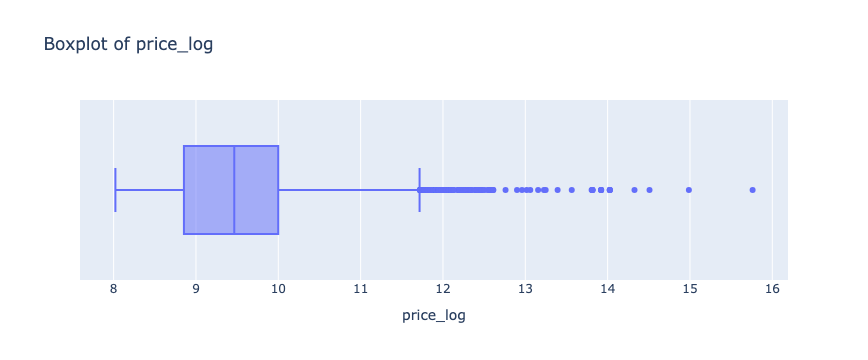

In [416]:
px.box(df, x="price_log", title = "Boxplot of price_log")
# auto_df['price_log'].plot(kind = 'box', vert = False, title = "Boxplot of log price");

**we will also take the log of the odometer column**

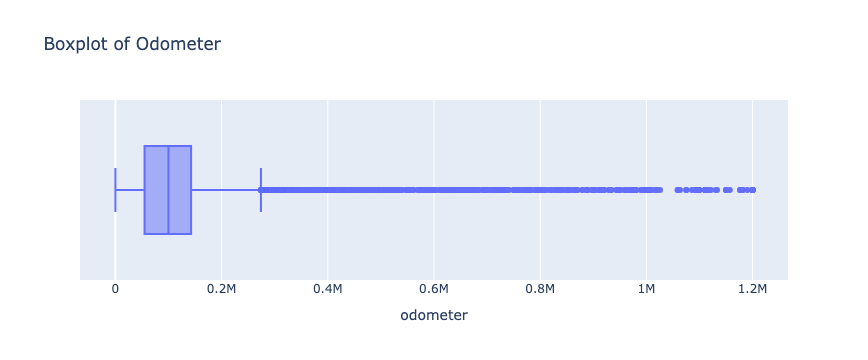

In [417]:
px.box(df, x="odometer", title = "Boxplot of Odometer")

In [418]:
df["odometer_log"] = np.log(df['odometer'])

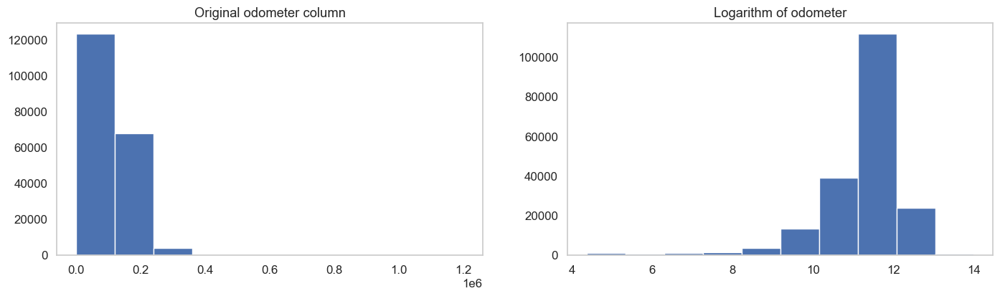

In [419]:
fig, ax = plt.subplots(1, 2, figsize = (15, 4))
ax[0].hist(df['odometer'])
ax[0].grid()
ax[0].set_title('Original odometer column')
ax[1].hist((df['odometer_log']))
ax[1].grid()
ax[1].set_title('Logarithm of odometer');

**Categorical Value relationship**\
**Relationship with `transmission`**

In [420]:
df['transmission'].unique()

array(['other', 'automatic', 'manual'], dtype=object)

In [421]:
df.groupby('transmission')['price'].describe()

,count,mean,std,min,25%,50%,75%,max
transmission,,,,,,,,
automatic,170572.00,16610.37,23850.33,3045.00,6999.00,12196.00,21000.00,6995495.00
manual,15033.00,15741.80,32902.73,3050.00,6000.00,10500.00,18995.00,3226714.00
other,10096.00,25904.13,28241.91,3100.00,17990.00,24590.00,32590.00,1666666.00


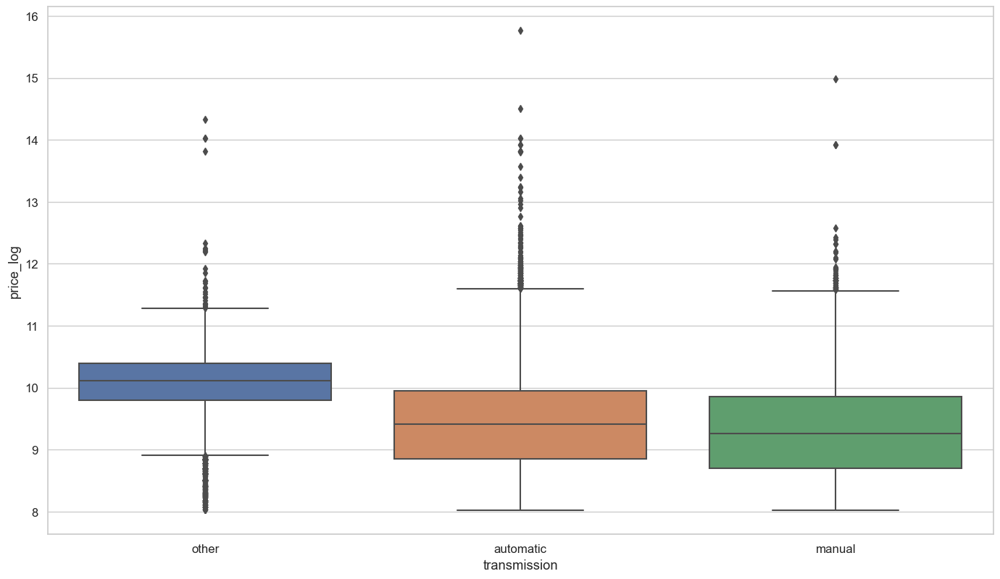

In [422]:
sns.boxplot(x = 'transmission', y = 'price_log', data = df);
plt.title("Other is the most expensive transmissionn type")

This is in accordance what we've previously seen that hybrid or electric vehicles are more expensive in the used car market.

**Relationship with `manufacturer`**

In [423]:
df['manufacturer'].unique()

array(['gmc', 'chevrolet', 'toyota', 'ford', 'jeep', 'nissan', 'ram',
       'mazda', 'cadillac', 'honda', 'dodge', 'lexus', 'jaguar', 'volvo',
       'audi', 'infiniti', 'lincoln', 'alfa-romeo', 'acura', 'hyundai',
       'chrysler', 'buick', 'mercedes-benz', 'bmw', 'mitsubishi',
       'subaru', 'volkswagen', 'porsche', 'kia', 'rover', 'ferrari',
       'mini', 'pontiac', 'fiat', 'tesla', 'mercury', 'saturn',
       'harley-davidson', 'datsun', 'aston-martin', 'land rover',
       'morgan'], dtype=object)

In [424]:
df['manufacturer'].nunique()

42

In [425]:
# Numerical Summary
df.groupby('manufacturer')['price'].describe()

,count,mean,std,min,25%,50%,75%,max
manufacturer,,,,,,,,
acura,2118.00,15609.98,11894.57,3199.00,6999.00,11996.50,21500.00,139999.00
alfa-romeo,182.00,27704.64,9081.88,3500.00,25991.25,28401.00,30993.75,62950.00
aston-martin,15.00,75406.67,43166.88,32900.00,42747.50,68950.00,86492.50,179888.00
audi,3070.00,20469.68,14225.98,3100.00,10500.00,17000.00,27957.25,160000.00
bmw,6459.00,17808.51,12118.02,3100.00,8950.00,14799.00,24465.00,138000.00
buick,2367.00,12922.79,9401.03,3100.00,5995.00,10000.00,17990.00,123456.00
cadillac,3043.00,17828.59,14676.88,3200.00,7500.00,13599.00,22999.00,195000.00
chevrolet,25232.00,17778.66,21537.26,3045.00,7450.00,13076.00,23146.00,1234567.00
chrysler,2933.00,11201.94,18175.83,3100.00,5500.00,8000.00,13500.00,655000.00


Text(0.5, 1.0, 'Ferrari, Aston-Martin and Tesla are the most expensive manufacturers')

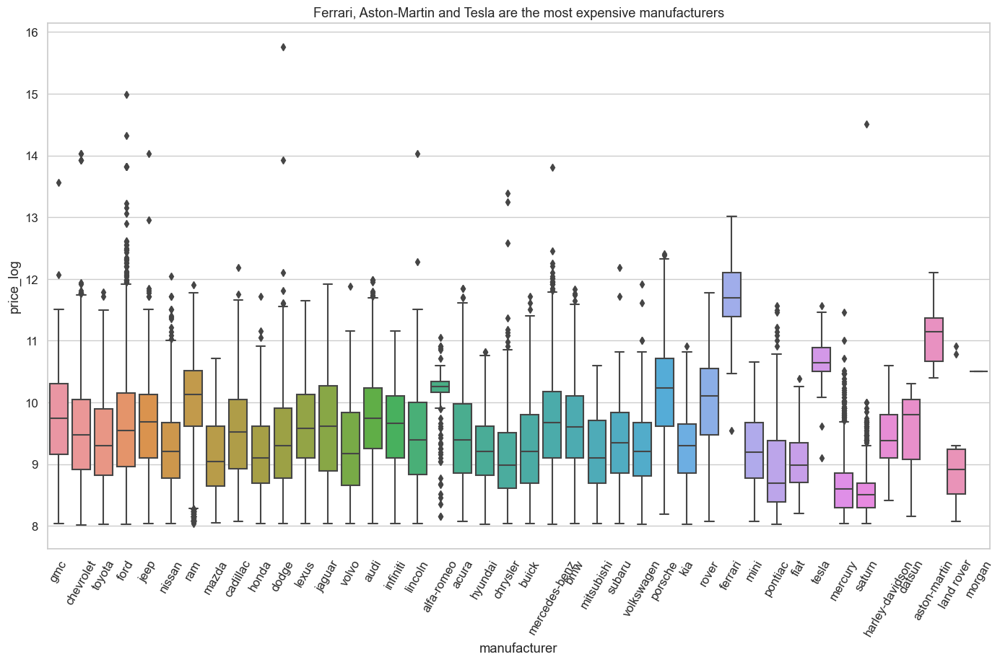

In [458]:
sns.boxplot(x = 'manufacturer', y = 'price_log', data = df)
plt.xticks(rotation=60);
# a lot of variety for different manufactuer types
plt.title("Ferrari, Aston-Martin and Tesla are the most expensive manufacturers")

**Relationship with `condition`**

In [427]:
df['condition'].unique()

array(['good', 'excellent', 'like new', 'new', 'fair', 'salvage'],
      dtype=object)

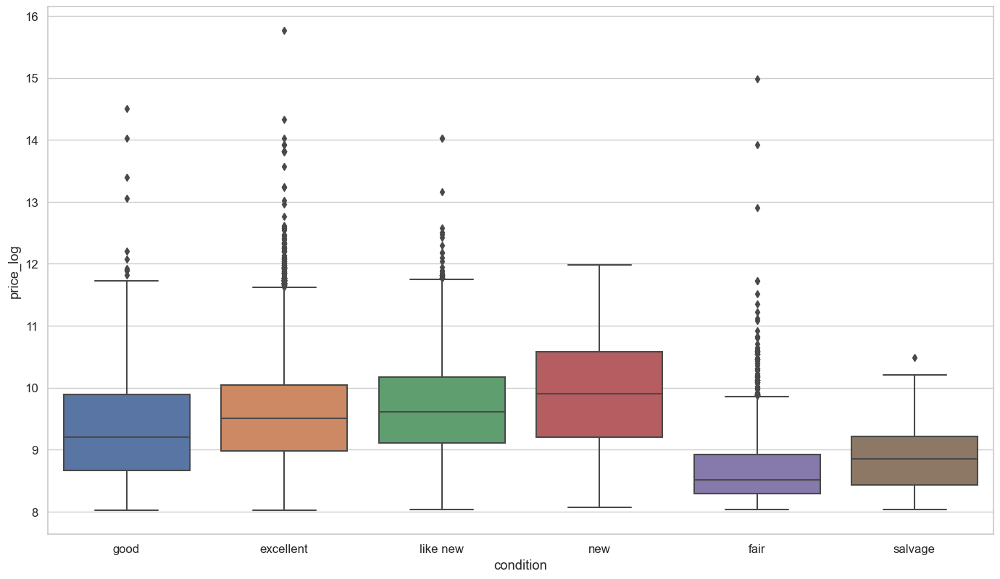

In [428]:
sns.boxplot(x = 'condition', y = 'price_log', data = df);
# highest median price for new cars, lowest median for salvage 

**Relationship with `paint_color`**

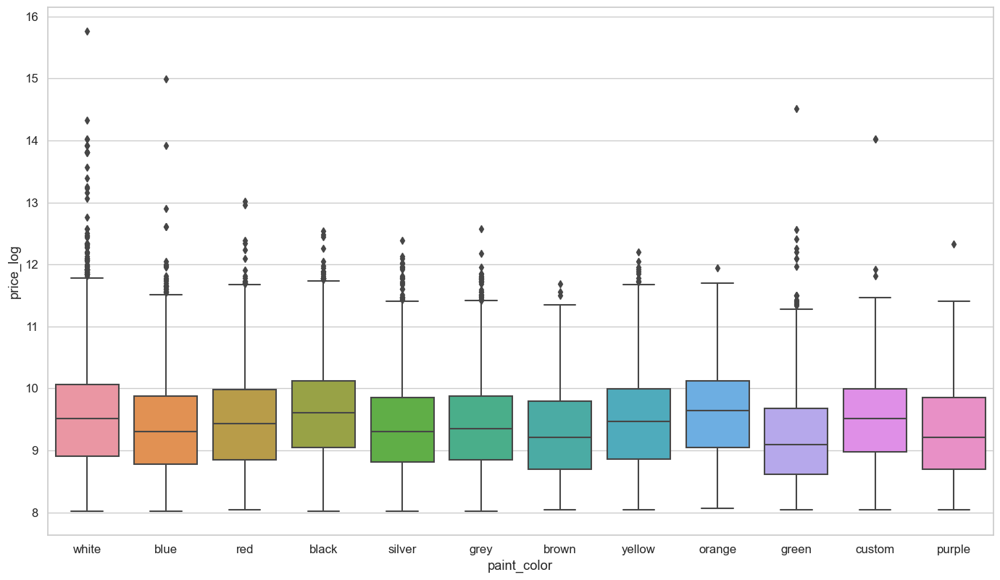

In [430]:
sns.boxplot(x = 'paint_color', y = 'price_log', data = df);
# custom, orange, and white, and black seem to be on the higher end

**Relationship with `drive`**

In [431]:
df['drive'].unique()

array(['4wd', 'rwd', 'fwd'], dtype=object)

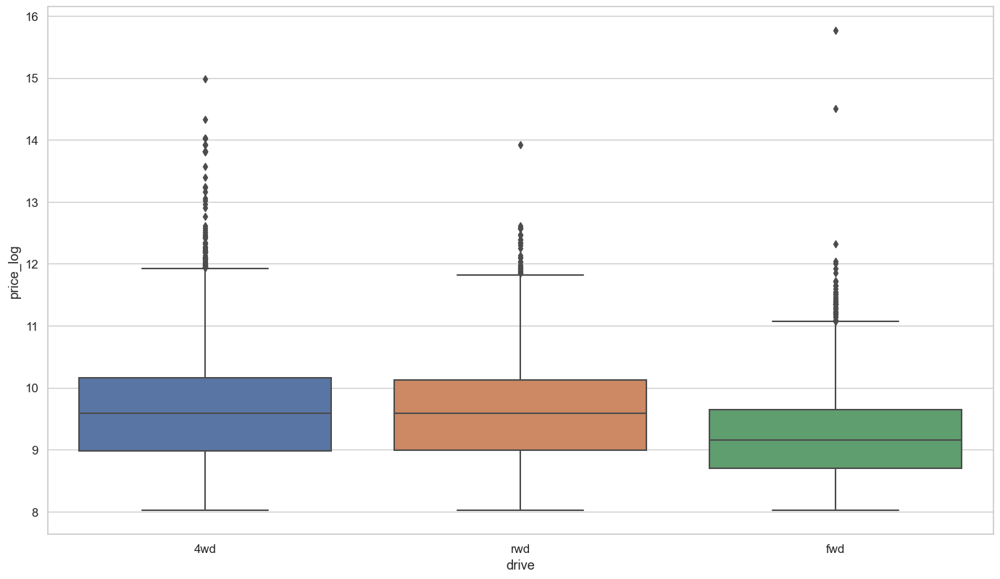

In [432]:
sns.boxplot(x = 'drive', y = 'price_log', data = df);
# they are pretty similar, but forward wheel drive is at the bottom

**Bivariate Analysis**

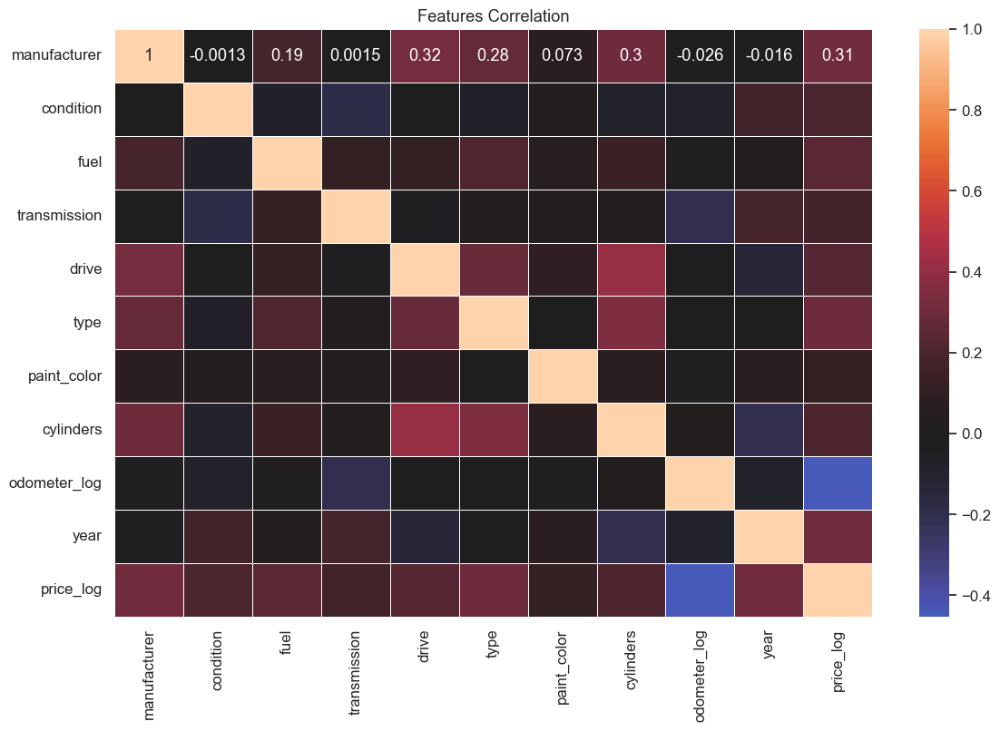

In [433]:
categorical = ['manufacturer', 'condition', 'fuel', 'transmission', 'drive', 'type', 'paint_color']
encoder = TargetEncoder()
encoded_df = pd.concat([encoder.fit_transform(df[categorical] , df["price_log"]), df[['cylinders','odometer_log', 'year', 'price_log']]], axis = 1).corr()

sns.cubehelix_palette(as_cmap=True)
f, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(encoded_df, center = 0, linewidth = .5, annot = True).set(title='Features Correlation');

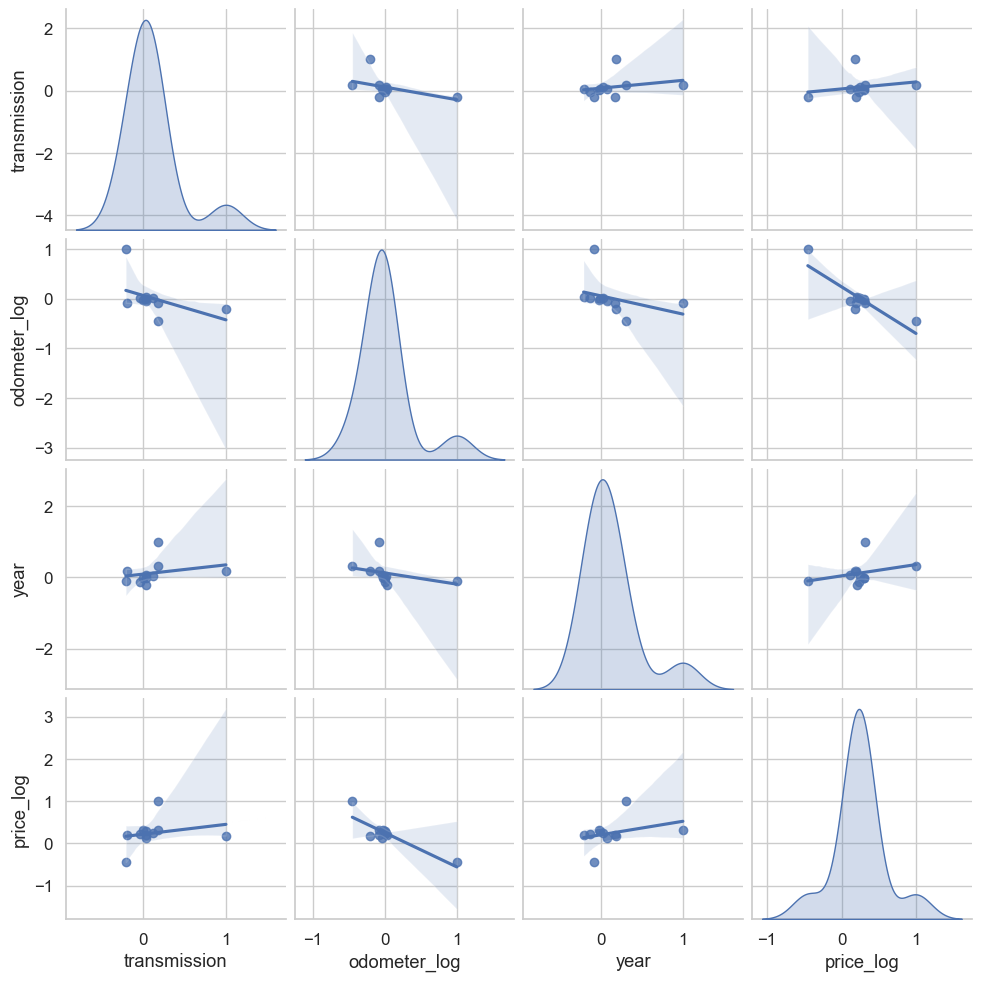

In [434]:
sns.pairplot(encoded_df[['transmission', 'odometer_log', 'year', 'price_log']], kind="reg", diag_kind="kde")

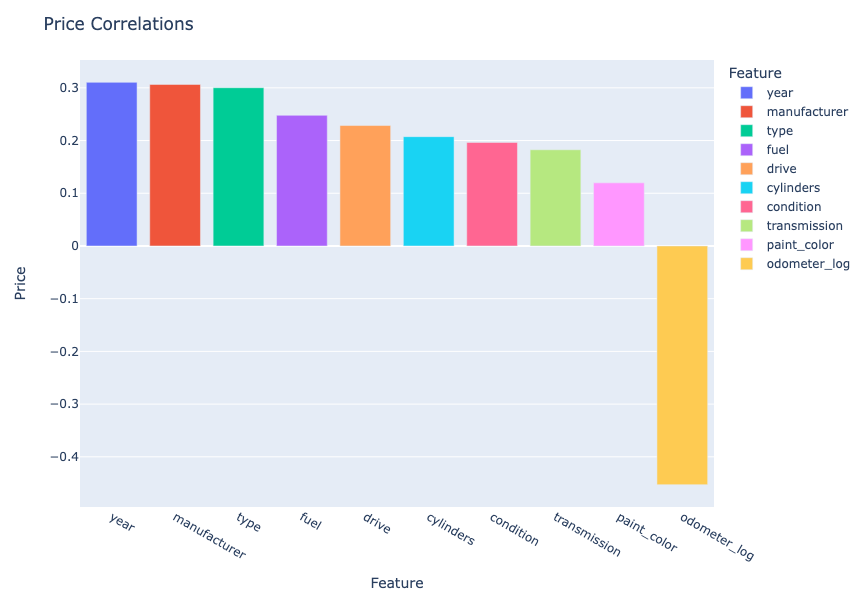

In [435]:
encoded_df_price = encoded_df[['price_log']].sort_values(by = 'price_log', ascending = False).reset_index()
fig = px.bar(encoded_df_price[1:], x = 'index', y = 'price_log', color='index', labels={'price_log':'Price', 'index' : 'Feature'})
fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    title="Price Correlations"
)

fig.show()

In [438]:
df.to_csv('prepared_df.csv')

In [439]:
X = df.drop(['price', 'price_log'], axis=1)
y = df['price_log']  # Using the log of price for a more normal distribution

### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

In [440]:
# Define columns for different types of encoding
categorical_nominal = ['manufacturer', 'fuel', 'transmission', 'drive', 'type', 'paint_color']
categorical_ordinal = ['condition']
numerical_features = ['year', 'cylinders', 'odometer']

In [441]:
# Create the transformers for the column transformer
nominal_transformer = OneHotEncoder(drop='first', handle_unknown='ignore')
ordinal_transformer = OrdinalEncoder(categories=[['salvage', 'fair', 'good', 'excellent', 'like new', 'new']])
standard_transformer = StandardScaler()

In [442]:
# Create the column transformer
preprocessor = ColumnTransformer(
    transformers=[
        ('nom', nominal_transformer, categorical_nominal),
        ('ord', ordinal_transformer, categorical_ordinal),
        ('num', standard_transformer, numerical_features)
    ])

**Baseline Linear Regression model**

In [443]:
# Create a preprocessing and modeling pipeline
model_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                 ('model', LinearRegression())])

In [444]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [445]:
# Fit the pipeline
model_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('nom',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore'),
                                                  ['manufacturer', 'fuel',
                                                   'transmission', 'drive',
                                                   'type', 'paint_color']),
                                                 ('ord',
                                                  OrdinalEncoder(categories=[['salvage',
                                                                              'fair',
                                                                              'good',
                                                                              'excellent',
                                                                              'like '
                                                                              'new',
                                                                              'new']]),
                                                  ['condition']),
                                                 ('num', StandardScaler(),
                                                  ['year', 'cylinders',
                                                   'odometer'])])),
                ('model', LinearRegression())])

**Finding an optimal alpha with GridSearchCV**

In [447]:
# Parameter grid for GridSearchCV
param_grid = [
    {'model': [Lasso()], 'model__alpha': [0.001, 0.01, 0.1, 1, 10]},
    {'model': [Ridge()], 'model__alpha': [0.001, 0.01, 0.1, 1, 10]}
]

In [448]:
# Setup the GridSearchCV
grid_search = GridSearchCV(model_pipeline, param_grid, cv=5, scoring='r2', verbose=3)

In [449]:
# Perform the grid search
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END .model=Lasso(), model__alpha=0.001;, score=0.501 total time=   0.5s
[CV 2/5] END .model=Lasso(), model__alpha=0.001;, score=0.495 total time=   0.5s
[CV 3/5] END .model=Lasso(), model__alpha=0.001;, score=0.495 total time=   0.5s
[CV 4/5] END .model=Lasso(), model__alpha=0.001;, score=0.509 total time=   0.5s
[CV 5/5] END .model=Lasso(), model__alpha=0.001;, score=0.493 total time=   0.5s
[CV 1/5] END ..model=Lasso(), model__alpha=0.01;, score=0.449 total time=   0.2s
[CV 2/5] END ..model=Lasso(), model__alpha=0.01;, score=0.445 total time=   0.2s
[CV 3/5] END ..model=Lasso(), model__alpha=0.01;, score=0.445 total time=   0.2s
[CV 4/5] END ..model=Lasso(), model__alpha=0.01;, score=0.457 total time=   0.2s
[CV 5/5] END ..model=Lasso(), model__alpha=0.01;, score=0.442 total time=   0.2s
[CV 1/5] END ...model=Lasso(), model__alpha=0.1;, score=0.277 total time=   0.2s
[CV 2/5] END ...model=Lasso(), model__alpha=0.1;

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('nom',
                                                                         OneHotEncoder(drop='first',
                                                                                       handle_unknown='ignore'),
                                                                         ['manufacturer',
                                                                          'fuel',
                                                                          'transmission',
                                                                          'drive',
                                                                          'type',
                                                                          'paint_color']),
                                                                        ('ord',
                                                                         OrdinalEncoder(categories=[['salvage',
                                                                                                     'fair',
                                                                                                     'good',
                                                                                                     'excellent',
                                                                                                     'like '
                                                                                                     'new',
                                                                                                     'new']]),
                                                                         ['condition']),
                                                                        ('num',
                                                                         StandardScaler(),
                                                                         ['year',
                                                                          'cylinders',
                                                                          'odometer'])])),
                                       ('model', LinearRegression())]),
             param_grid=[{'model': [Lasso()],
                          'model__alpha': [0.001, 0.01, 0.1, 1, 10]},
                         {'model': [Ridge(alpha=1)],
                          'model__alpha': [0.001, 0.01, 0.1, 1, 10]}],
             scoring='r2', verbose=3)

In [450]:
# Best model and parameters
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Best Model:", best_model)
print("Best Parameters:", best_params)
print("Best Score:", best_score)

Best Model: Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('nom',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore'),
                                                  ['manufacturer', 'fuel',
                                                   'transmission', 'drive',
                                                   'type', 'paint_color']),
                                                 ('ord',
                                                  OrdinalEncoder(categories=[['salvage',
                                                                              'fair',
                                                                              'good',
                                                                              'excellent',
                                                                              'like '
        

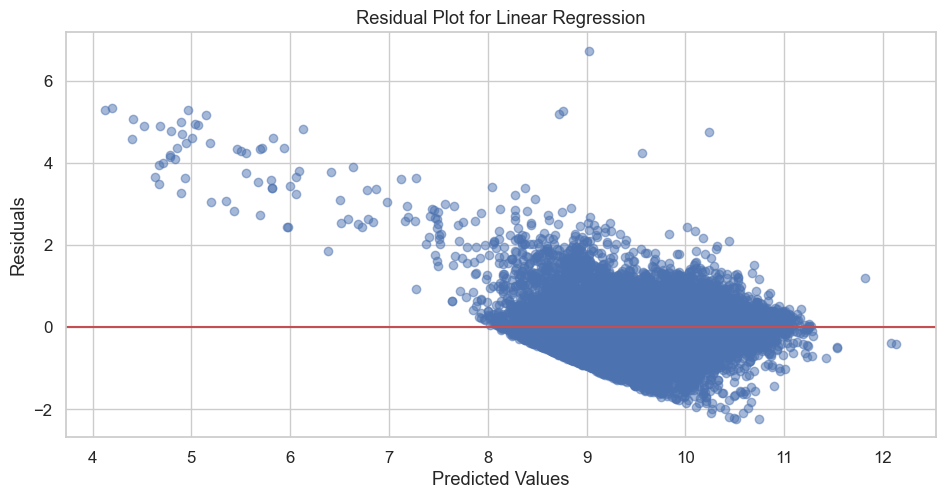

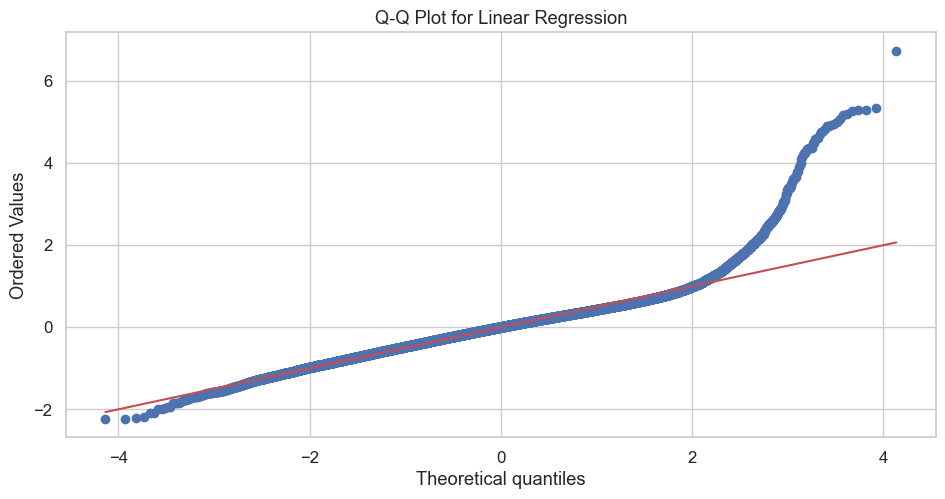

In [451]:
# Predictions and residuals for the baseline Linear Regression model
y_pred_linear = model_pipeline.predict(X_test)  # Using the model_pipeline which has LinearRegression
residuals_linear = y_test - y_pred_linear

# Predictions and residuals for the best-performing Ridge model
y_pred_ridge = best_model.predict(X_test)  # Using the best_model from GridSearchCV
residuals_ridge = y_test - y_pred_ridge

# Residual Plot for Linear Regression
plt.figure(figsize=(10, 5))
plt.scatter(y_pred_linear, residuals_linear, alpha=0.5)
plt.title('Residual Plot for Linear Regression')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.axhline(y=0, color='r', linestyle='-')
plt.show()

# Q-Q Plot for Linear Regression
plt.figure(figsize=(10, 5))
stats.probplot(residuals_linear, dist="norm", plot=plt)
plt.title('Q-Q Plot for Linear Regression')
plt.show()

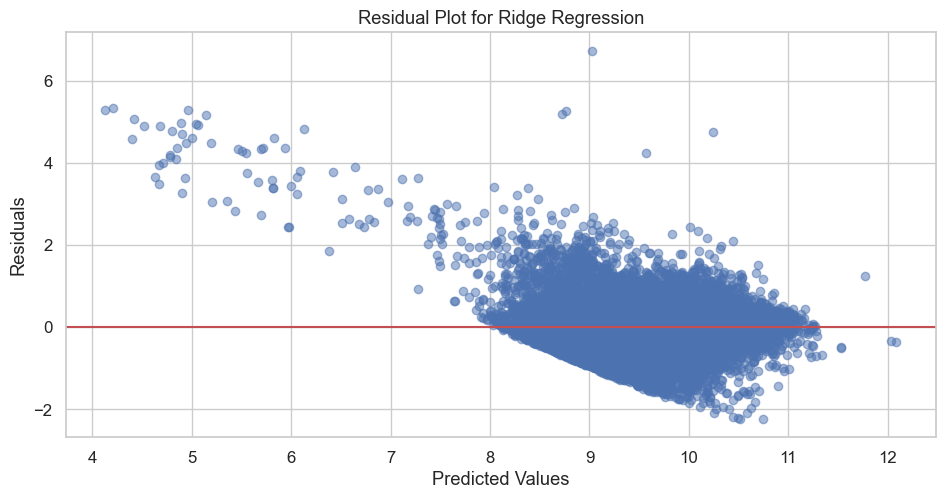

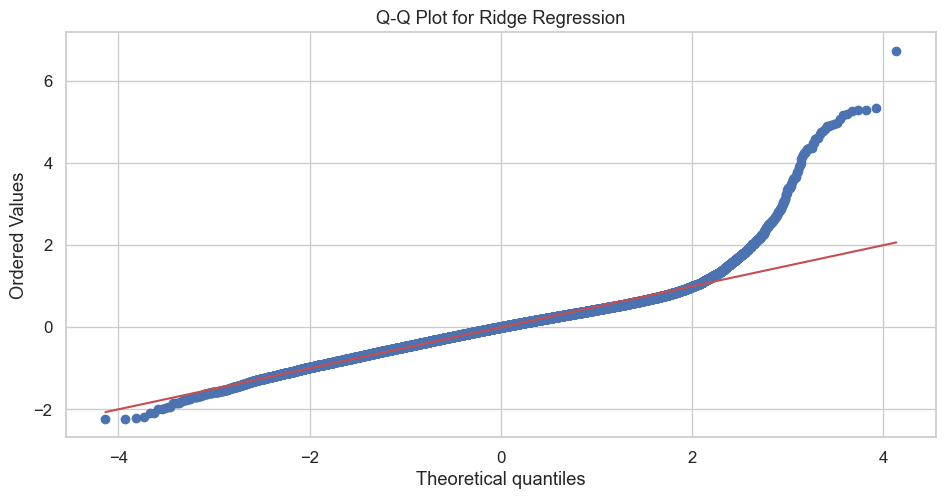

In [452]:
# Residual Plot for Ridge Regression
plt.figure(figsize=(10, 5))
plt.scatter(y_pred_ridge, residuals_ridge, alpha=0.5)
plt.title('Residual Plot for Ridge Regression')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.axhline(y=0, color='r', linestyle='-')
plt.show()

# Q-Q Plot for Ridge Regression
plt.figure(figsize=(10, 5))
stats.probplot(residuals_ridge, dist="norm", plot=plt)
plt.title('Q-Q Plot for Ridge Regression')
plt.show()

In [453]:
ridge_model = best_model.named_steps['model']
feature_names = best_model.named_steps['preprocessor'].get_feature_names_out()
ridge_coefs = ridge_model.coef_
# Match the coefficients with the feature names
feature_importance = zip(feature_names, ridge_coefs)
# Sort the features by the absolute value of their coefficient
sorted_feature_importance = sorted(feature_importance, key=lambda x: abs(x[1]), reverse=True)

# Display the features and their coefficients
for feature, coef in sorted_feature_importance:
    print(f'{feature}: {coef}')

nom__manufacturer_ferrari: 1.5624186191802296
nom__manufacturer_aston-martin: 0.9525521580818581
nom__manufacturer_tesla: 0.8463137484933175
nom__fuel_electric: -0.7158508627982276
nom__fuel_hybrid: -0.6325046694529183
nom__fuel_gas: -0.6232425722664955
nom__manufacturer_saturn: -0.6223027691113755
nom__manufacturer_harley-davidson: -0.6089885139721243
nom__manufacturer_datsun: 0.522694057175649
nom__manufacturer_porsche: 0.5028652411791076
nom__manufacturer_fiat: -0.4908863129341834
nom__manufacturer_mercury: -0.46689789020462447
nom__fuel_other: -0.41294495263343184
nom__manufacturer_mitsubishi: -0.33785373770264593
nom__transmission_other: 0.33423497498572396
num__odometer: -0.3048315351593921
nom__manufacturer_alfa-romeo: 0.2805286549798072
nom__manufacturer_rover: 0.2679869496050253
nom__manufacturer_chrysler: -0.26742345459296735
nom__manufacturer_morgan: 0.23835137089903308
nom__manufacturer_mazda: -0.23445301205017444
nom__manufacturer_pontiac: -0.2328574453948298
nom__manufact

In [454]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

param_grid = [
    {'model': [RandomForestRegressor()], 'model__n_estimators': [100, 200], 'model__max_features': ['auto', 'sqrt']},
    {'model': [GradientBoostingRegressor()], 'model__n_estimators': [100, 200], 'model__learning_rate': [0.01, 0.1, 0.2]}
]

grid_search = GridSearchCV(model_pipeline, param_grid, cv=5, scoring='r2', verbose=3)
grid_search.fit(X_train, y_train)

# Capture the best model and parameters again after fitting
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Best Model:", best_model)
print("Best Parameters:", best_params)
print("Best Score:", best_score)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END model=RandomForestRegressor(), model__max_features=auto, model__n_estimators=100;, score=0.763 total time= 9.3min
[CV 2/5] END model=RandomForestRegressor(), model__max_features=auto, model__n_estimators=100;, score=0.761 total time= 9.3min
[CV 3/5] END model=RandomForestRegressor(), model__max_features=auto, model__n_estimators=100;, score=0.760 total time= 9.4min
[CV 4/5] END model=RandomForestRegressor(), model__max_features=auto, model__n_estimators=100;, score=0.761 total time= 9.3min
[CV 5/5] END model=RandomForestRegressor(), model__max_features=auto, model__n_estimators=100;, score=0.758 total time= 9.3min
[CV 1/5] END model=RandomForestRegressor(), model__max_features=auto, model__n_estimators=200;, score=0.763 total time=30.1min
[CV 2/5] END model=RandomForestRegressor(), model__max_features=auto, model__n_estimators=200;, score=0.763 total time=18.4min
[CV 3/5] END model=RandomForestRegressor(), model_

In [459]:
print("Best Model:", best_model)
print("Best Parameters:", best_params)
print("Best Score:", best_score)

Best Model: Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('nom',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore'),
                                                  ['manufacturer', 'fuel',
                                                   'transmission', 'drive',
                                                   'type', 'paint_color']),
                                                 ('ord',
                                                  OrdinalEncoder(categories=[['salvage',
                                                                              'fair',
                                                                              'good',
                                                                              'excellent',
                                                                              'like '
        

### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

Model Development:
Several regression models were tested to predict the logarithm of the car prices, which helps in dealing with skewed distributions and provides a more normal distribution of the target variable:

* Linear Regression served as our baseline model.
* Lasso and Ridge Regression were utilized to check for improvements with regularization.
* Random Forest and Gradient Boosting Regressors were explored for their ability to capture non-linear relationships and interactions between features.

In [478]:
# Evaluate Best Model 
y_pred_rand = best_model.predict(X_test)
mae_rand = mean_absolute_error(y_test, y_pred_rand) 
rmse_rand = mean_squared_error(y_test, y_pred_rand, squared=False) 
r2_rand = r2_score(y_test, y_pred_rand)

# Evaluate Linear Regression
mae_linear = mean_absolute_error(y_test, y_pred_linear)
rmse_linear = mean_squared_error(y_test, y_pred_linear, squared=False)
r2_linear = r2_score(y_test, y_pred_linear)

# Evaluate Ridge
mae_ridge = mean_absolute_error(y_test, y_pred_ridge)
rmse_ridge = mean_squared_error(y_test, y_pred_ridge, squared=False)
r2_ridge = r2_score(y_test, y_pred_ridge)

ValueError: Found input variables with inconsistent numbers of samples: [39144, 39141]

In [477]:
print("Random Forest MAE:", mae_rand)
print("Random Forest RMSE:", rmse_rand)
print("Random Forest R^2 Score:", r2_rand)
print("\nUnpenalized Linear Regression MAE:", mae_linear)
print("Unpenalized Linear Regression RMSE:", rmse_linear)
print("Unpenalized Linear Regression R^2 Score:", r2_linear)
print("\nRidge MAE:", mae_ridge)
print("Ridge RMSE:", rmse_ridge)
print("Ridge R^2 Score:", r2_ridge)

Random Forest MAE: 0.2499474687967395
Random Forest RMSE: 0.35185370180802245
Random Forest R^2 Score: 0.7713268916160164

Unpenalized Linear Regression MAE: 0.37836839268344924
Unpenalized Linear Regression RMSE: 0.5155964549018595
Unpenalized Linear Regression R^2 Score: 0.5089669871469786

Ridge MAE: 0.37837236609158453
Ridge RMSE: 0.5155977912161951
Ridge R^2 Score: 0.5089644418412518


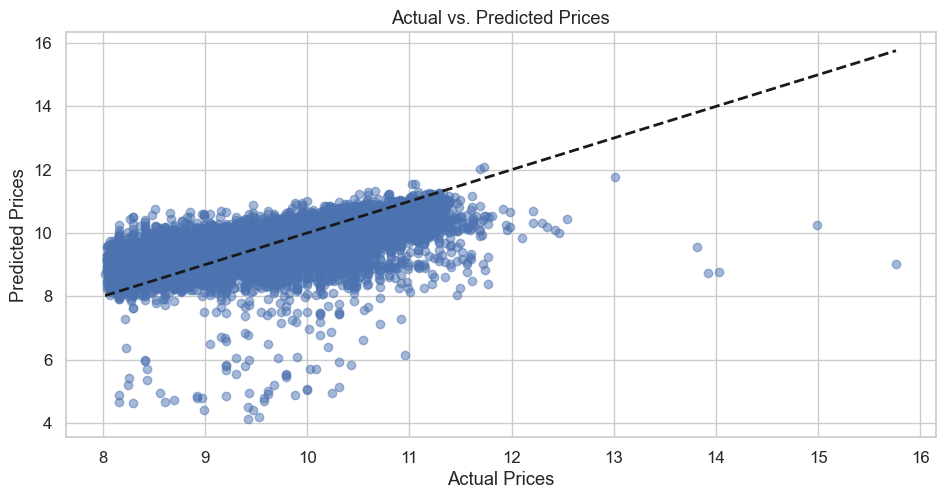

In [457]:
plt.figure(figsize=(10, 5))
plt.scatter(y_test, y_pred_ridge, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.title('Actual vs. Predicted Prices')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.show()

### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.

The goal to identify factors affecting the price of used cars to assist used car dealers in inventory management is clearly defined and relevant.


**Key Findings**
Our analysis revealed several critical insights:

* Age of the Vehicle: Newer cars tend to sell at higher prices. Inventory should be adjusted to favor newer model years to enhance profitability.
* Mileage: Cars with lower odometers read higher prices. Stocking cars with lower mileage can be more attractive to buyers.
* Brand and Model: Certain brands and models hold their value better than others. Focusing on these can improve inventory turnover rates.
* Vehicle Condition: Well-maintained vehicles and those in excellent condition fetch higher prices. Ensuring your cars are in good condition can command premium pricing.

**Recommendations**
Based on our findings, we recommend the following strategies:

* Focus on Newer, Low-Mileage Vehicles: Prioritize acquiring newer models with lower mileage to attract price-conscious consumers looking for reliable used cars.
* Brand-specific Inventory Adjustments: Increase the stock of brands that are known to retain value over time. Reduce inventory of brands that depreciate quickly.
* Dynamic Pricing Strategy: Implement a pricing strategy that adjusts based on the car’s age, mileage, and brand data to maximize profit margins.
* Condition Checks: Regularly perform maintenance checks to ensure all vehicles are in optimal condition before sale, enhancing their market value.